# **Importing the required libraries**

In [1]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow 
import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")
%matplotlib inline

C:\Users\Ananya\AppData\Local\Temp\ipykernel_3796\3123616039.py:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


In [2]:
from sklearn.model_selection import train_test_split
from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

# **Visualize the Data**

In [3]:
from IPython.display import HTML
from base64 import b64encode

# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

In [4]:
# Classes Directories
NonViolnceVideos_Dir = os.path.join('assets','archive','real life violence situations','Real Life Violence Dataset','NonViolence')
ViolnceVideos_Dir = os.path.join('assets','archive','real life violence situations','Real Life Violence Dataset','Violence')
# NonViolnceVideos_Dir = "archive\real life violence situations\Real Life Violence Dataset\NonViolence"
# ViolnceVideos_Dir = "archive\real life violence situations\Real Life Violence Dataset\Violence"
# Retrieve the list of all the video files present in the Class Directory.
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

# Random selection
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

**Play Random Non Violence Video**

In [5]:
Play_Video(f"{NonViolnceVideos_Dir}/{Random_NonViolence_Video}")

**Play Random Violence Video**

In [6]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")

# **Extracting Frames**

In [7]:
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 16
 
DATASET_DIR = os.path.join('assets','archive','real life violence situations','Real Life Violence Dataset')
 
CLASSES_LIST = ["NonViolence","Violence"]

In [8]:
def frames_extraction(video_path):
 
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)
    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        ret, frame = video_reader.read() 
        if not ret:
            break
 
        # Normalization
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        
        frames_list.append(normalized_frame)
        
    video_reader.release()
 
    return frames_list

# **Creating the Data**

In [9]:
def create_dataset():
 
    features = []
    labels = []
    video_files_paths = []
    
    for class_index, class_name in enumerate(CLASSES_LIST):
        print(f'Extracting Data of Class: {class_name}')
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        for file_name in files_list:
            print(file_name)
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
            frames = frames_extraction(video_file_path)
            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)
    features = np.asarray(features)
    labels = np.array(labels)  

    return features, labels, video_files_paths

# Dataset Created
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: NonViolence
NV_1.mp4
NV_10.mp4
NV_100.mp4
NV_1000.mp4
NV_101.mp4
NV_102.mp4
NV_103.mp4
NV_104.mp4
NV_105.mp4
NV_106.mp4
NV_107.mp4
NV_108.mp4
NV_109.mp4
NV_11.mp4
NV_110.mp4
NV_111.mp4
NV_112.mp4
NV_113.mp4
NV_114.mp4
NV_115.mp4
NV_116.mp4
NV_117.mp4
NV_118.mp4
NV_119.mp4
NV_12.mp4
NV_120.mp4
NV_121.mp4
NV_122.mp4
NV_123.mp4
NV_124.mp4
NV_125.mp4
NV_126.mp4
NV_127.mp4
NV_128.mp4
NV_129.mp4
NV_13.mp4
NV_130.mp4
NV_131.mp4
NV_132.mp4
NV_133.mp4
NV_134.mp4
NV_135.mp4
NV_136.mp4
NV_137.mp4
NV_138.mp4
NV_139.mp4
NV_14.mp4
NV_140.mp4
NV_141.mp4
NV_142.mp4
NV_143.mp4
NV_144.mp4
NV_145.mp4
NV_146.mp4
NV_147.mp4
NV_148.mp4
NV_149.mp4
NV_15.mp4
NV_150.mp4
NV_151.mp4
NV_152.mp4
NV_153.mp4
NV_154.mp4
NV_155.mp4
NV_156.mp4
NV_157.mp4
NV_158.mp4
NV_159.mp4
NV_16.mp4
NV_160.mp4
NV_161.mp4
NV_162.mp4
NV_163.mp4
NV_164.mp4
NV_165.mp4
NV_166.mp4
NV_167.mp4
NV_168.mp4
NV_169.mp4
NV_17.mp4
NV_170.mp4
NV_171.mp4
NV_172.mp4
NV_173.mp4
NV_174.mp4
NV_175.mp4
NV_176.mp4
NV_177.mp4
NV_

NV_773.mp4
NV_774.mp4
NV_775.mp4
NV_776.mp4
NV_777.mp4
NV_778.mp4
NV_779.mp4
NV_78.mp4
NV_780.mp4
NV_781.mp4
NV_782.mp4
NV_783.mp4
NV_784.mp4
NV_785.mp4
NV_786.mp4
NV_787.mp4
NV_788.mp4
NV_789.mp4
NV_79.mp4
NV_790.mp4
NV_791.mp4
NV_792.mp4
NV_793.mp4
NV_794.mp4
NV_795.mp4
NV_796.mp4
NV_797.mp4
NV_798.mp4
NV_799.mp4
NV_8.mp4
NV_80.mp4
NV_800.mp4
NV_801.mp4
NV_802.mp4
NV_803.mp4
NV_804.mp4
NV_805.mp4
NV_806.mp4
NV_807.mp4
NV_808.mp4
NV_809.mp4
NV_81.mp4
NV_810.mp4
NV_811.mp4
NV_812.mp4
NV_813.mp4
NV_814.mp4
NV_815.mp4
NV_816.mp4
NV_817.mp4
NV_818.mp4
NV_819.mp4
NV_82.mp4
NV_820.mp4
NV_821.mp4
NV_822.mp4
NV_823.mp4
NV_824.mp4
NV_825.mp4
NV_826.mp4
NV_827.mp4
NV_828.mp4
NV_829.mp4
NV_83.mp4
NV_830.mp4
NV_831.mp4
NV_832.mp4
NV_833.mp4
NV_834.mp4
NV_835.mp4
NV_836.mp4
NV_837.mp4
NV_838.mp4
NV_839.mp4
NV_84.mp4
NV_840.mp4
NV_841.mp4
NV_842.mp4
NV_843.mp4
NV_844.mp4
NV_845.mp4
NV_846.mp4
NV_847.mp4
NV_848.mp4
NV_849.mp4
NV_85.mp4
NV_850.mp4
NV_851.mp4
NV_852.mp4
NV_853.mp4
NV_854.mp4
NV_855.mp

V_595.mp4
V_596.mp4
V_597.mp4
V_598.mp4
V_599.mp4
V_6.mp4
V_60.mp4
V_600.mp4
V_601.mp4
V_602.mp4
V_603.mp4
V_604.mp4
V_605.mp4
V_606.mp4
V_607.mp4
V_608.mp4
V_609.mp4
V_61.mp4
V_610.mp4
V_611.mp4
V_612.mp4
V_613.mp4
V_614.mp4
V_615.mp4
V_616.mp4
V_617.mp4
V_618.mp4
V_619.mp4
V_62.mp4
V_620.mp4
V_621.mp4
V_622.mp4
V_623.mp4
V_624.mp4
V_625.mp4
V_626.mp4
V_627.mp4
V_628.mp4
V_629.mp4
V_63.mp4
V_630.mp4
V_631.mp4
V_632.mp4
V_633.mp4
V_634.mp4
V_635.mp4
V_636.mp4
V_637.mp4
V_638.mp4
V_639.mp4
V_64.mp4
V_640.mp4
V_641.mp4
V_642.mp4
V_643.mp4
V_644.mp4
V_645.mp4
V_646.mp4
V_647.mp4
V_648.mp4
V_649.mp4
V_65.mp4
V_650.mp4
V_651.mp4
V_652.mp4
V_653.mp4
V_654.mp4
V_655.mp4
V_656.mp4
V_657.mp4
V_658.mp4
V_659.mp4
V_66.mp4
V_660.mp4
V_661.mp4
V_662.mp4
V_663.mp4
V_664.mp4
V_665.mp4
V_666.mp4
V_667.mp4
V_668.mp4
V_669.mp4
V_67.mp4
V_670.mp4
V_671.mp4
V_672.mp4
V_673.mp4
V_674.mp4
V_675.mp4
V_676.mp4
V_677.mp4
V_678.mp4
V_679.mp4
V_68.mp4
V_680.mp4
V_681.mp4
V_682.mp4
V_683.mp4
V_684.mp4
V_685.mp4
V

In [10]:
np.save("features.npy",features)
np.save("labels.npy",labels)
np.save("video_files_paths.npy",video_files_paths)

In [51]:
features, labels, video_files_paths = np.load("features.npy") , np.load("labels.npy") ,  np.load("video_files_paths.npy")

# **Training and Testing**

In [52]:
one_hot_encoded_labels = to_categorical(labels) # One hot encoding ( Cat to Int )

In [53]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.1,
                                                                            shuffle = True, random_state = 42)

In [54]:
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(1800, 16, 64, 64, 3) (1800, 2)
(200, 16, 64, 64, 3) (200, 2)


# **Importing MobileNet and Fine-Tuning it.**

In [55]:
from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2(include_top=False , weights="imagenet")
mobilenet.trainable=True
for layer in mobilenet.layers[:-40]: # last 40
  layer.trainable=False

#mobilenet.summary()

# **Building The Model**

In [56]:
def create_model():
 
    model = Sequential()

    model.add(Input(shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    model.add(TimeDistributed(mobilenet))
    
    model.add(Dropout(0.25))
                                    
    model.add(TimeDistributed(Flatten()))

    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards = True)  

    model.add(Bidirectional(lstm_fw, backward_layer = lstm_bw))
    
    model.add(Dropout(0.25))

    model.add(Dense(256,activation='relu'))
    
    model.add(Dropout(0.25))

    model.add(Dense(128,activation='relu'))
    
    model.add(Dropout(0.25))

    model.add(Dense(64,activation='relu'))
    
    model.add(Dropout(0.25))

    model.add(Dense(32,activation='relu'))
    
    model.add(Dropout(0.25))
    
    
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))
 
    model.summary()
    
    return model

In [57]:
MoBiLSTM_model = create_model()
plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_4 (TimeDis  (None, 16, 2, 2, 1280)   2257984   
 tributed)                                                       
                                                                 
 dropout_12 (Dropout)        (None, 16, 2, 2, 1280)    0         
                                                                 
 time_distributed_5 (TimeDis  (None, 16, 5120)         0         
 tributed)                                                       
                                                                 
 bidirectional_2 (Bidirectio  (None, 64)               1319168   
 nal)                                                            
                                                                 
 dropout_13 (Dropout)        (None, 64)                0         
                                                      

# **Preventing Overfitting**

In [58]:
early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.6,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)
MoBiLSTM_model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics = ["accuracy"])

MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 15, batch_size = 8,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])
 
# MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 30, batch_size = 8,
#                                              shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

# MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 15, batch_size = 8,
#                                              shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

# MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 20, batch_size = 4,
#                                              shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

# MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 25, batch_size = 8,
#                                              shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

Epoch 1/15
180/180 [==============================] - 264s 1s/step - loss: 0.6269 - accuracy: 0.6597 - val_loss: 0.5903 - val_accuracy: 0.6917 - lr: 0.0010
Epoch 2/15
180/180 [==============================] - 230s 1s/step - loss: 0.4733 - accuracy: 0.8021 - val_loss: 0.5753 - val_accuracy: 0.7250 - lr: 0.0010
Epoch 3/15
180/180 [==============================] - 223s 1s/step - loss: 0.3978 - accuracy: 0.8333 - val_loss: 0.4735 - val_accuracy: 0.8278 - lr: 0.0010
Epoch 4/15
180/180 [==============================] - 229s 1s/step - loss: 0.3837 - accuracy: 0.8431 - val_loss: 0.3697 - val_accuracy: 0.8278 - lr: 0.0010
Epoch 5/15
180/180 [==============================] - 229s 1s/step - loss: 0.3552 - accuracy: 0.8694 - val_loss: 0.5163 - val_accuracy: 0.8056 - lr: 0.0010
Epoch 6/15
180/180 [==============================] - 240s 1s/step - loss: 0.3105 - accuracy: 0.8938 - val_loss: 0.3538 - val_accuracy: 0.8889 - lr: 0.0010
Epoch 7/15
180/180 [==============================] - 227s 1s/st

In [59]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

7/7 [==============================] - 16s 1s/step - loss: 0.1885 - accuracy: 0.9300


# **Performance**

In [60]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    epochs = range(len(metric_value_1))
 
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
 
    plt.title(str(plot_name))
 
    plt.legend()

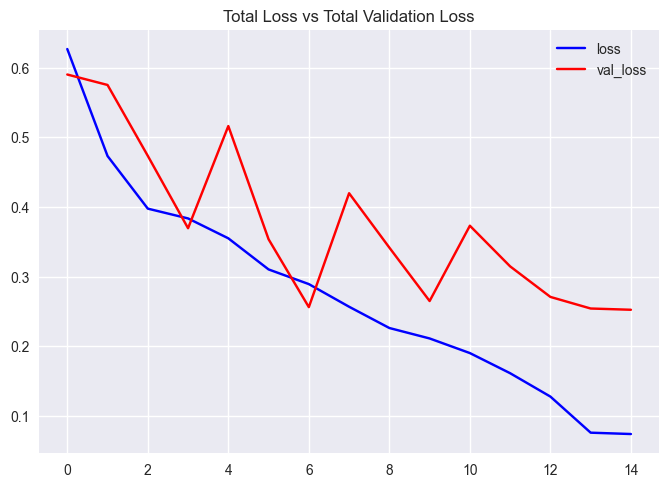

In [61]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

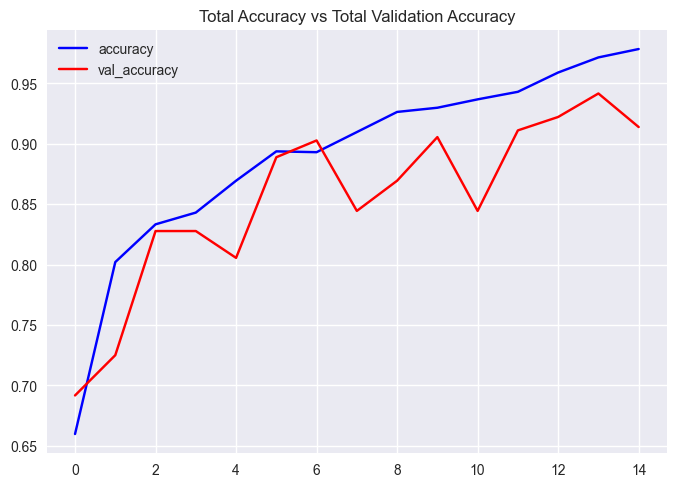

In [62]:
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

# **Test**

In [63]:
labels_predict = MoBiLSTM_model.predict(features_test)

7/7 [==============================] - 16s 2s/step


In [64]:
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)

In [65]:
labels_test_normal.shape , labels_predict.shape

((200,), (200,))

# **Accuracy Score**

In [66]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.93


Confusion Matrix

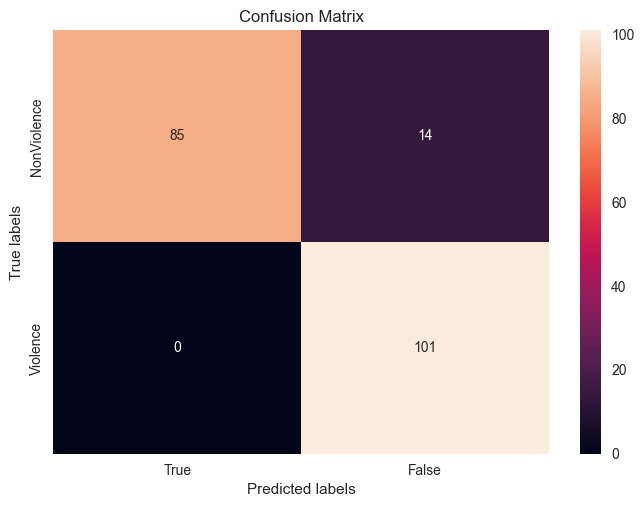

In [67]:
!pip install seaborn
import seaborn as sns 
from sklearn.metrics import confusion_matrix

ax= plt.subplot()
cm=confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax);  

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['True', 'False']); ax.yaxis.set_ticklabels(['NonViolence', 'Violence']);

# **Performance Metrics**

In [68]:
from sklearn.metrics import classification_report

cr = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', cr)

Classification Report is : 
               precision    recall  f1-score   support

           0       1.00      0.86      0.92        99
           1       0.88      1.00      0.94       101

    accuracy                           0.93       200
   macro avg       0.94      0.93      0.93       200
weighted avg       0.94      0.93      0.93       200



# **Test**

In [69]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'), 
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
    predicted_class_name = ''
 
    while video_reader.isOpened():
 
        ret, frame = video_reader.read() 
        
        if not ret:
            break
 
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
 
        frames_queue.append(normalized_frame)
    
        if len(frames_queue) == SEQUENCE_LENGTH:                        
 
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
            predicted_label = np.argmax(predicted_labels_probabilities)
            predicted_class_name = CLASSES_LIST[predicted_label]
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)
        video_writer.write(frame)                       
        
    video_reader.release()
    video_writer.release()

In [70]:
plt.style.use("default")

def show_pred_frames(pred_video_path): 

    plt.figure(figsize=(20,15))
    video_reader = cv2.VideoCapture(pred_video_path)
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))
        
    for counter, random_index in enumerate(random_range, 1):
        
        plt.subplot(5, 4, counter) 
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
        ret, frame = video_reader.read() 
        if not ret:
          break 

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)
        plt.imshow(frame);ax.figure.set_size_inches(20,20);plt.tight_layout()
                            
    video_reader.release()

In [71]:
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

1/1 [==============================] - 0s 107ms/step


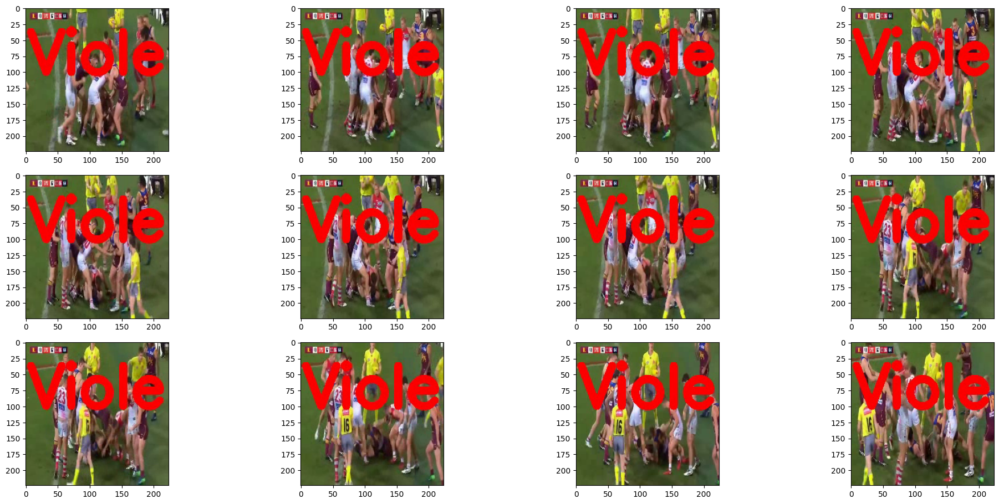

In [72]:
input_video_file_path = "assets/archive/real life violence situations/Real Life Violence Dataset/Violence/V_670.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)

In [73]:
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 187ms/step


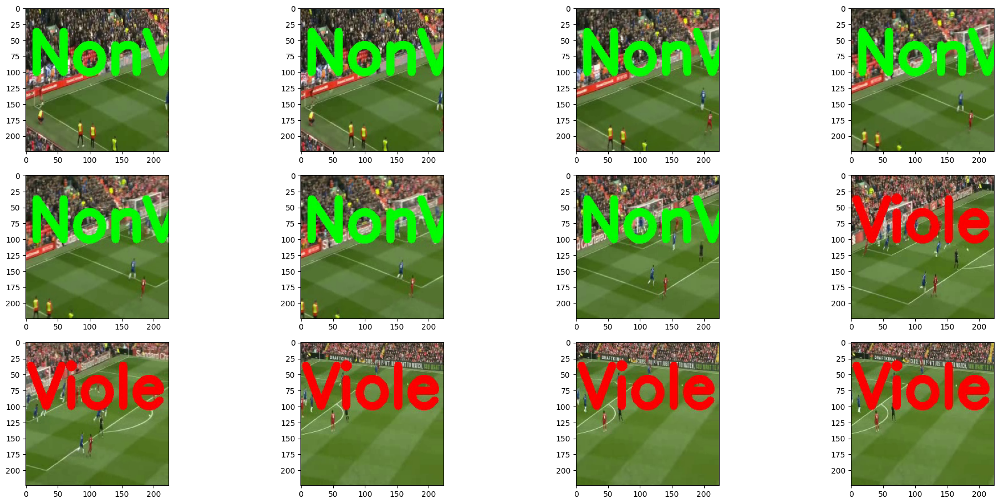

In [74]:
input_video_file_path = "assets/archive/real life violence situations/Real Life Violence Dataset/NonViolence/NV_102.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)

In [75]:
Play_Video(input_video_file_path)

# **Prediction Fn**

In [76]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
 
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_list = []
    predicted_class_name = ''
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
    
    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        ret, frame = video_reader.read() 
 
        if not ret:
            break
 
    # Prediction
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)
    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]
    predicted_label = np.argmax(predicted_labels_probabilities)
    predicted_class_name = CLASSES_LIST[predicted_label]
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    video_reader.release()

In [79]:
input_video_file_path = "assets/archive/real life violence situations/Real Life Violence Dataset/Violence/V_276.mp4"
predict_video(input_video_file_path, SEQUENCE_LENGTH)

Play_Video(input_video_file_path)

1/1 [==============================] - 0s 189ms/step
Predicted: Violence
Confidence: 0.9999983310699463


In [78]:
input_video_file_path = "assets/archive/real life violence situations/Real Life Violence Dataset/NonViolence/NV_23.mp4"
predict_video(input_video_file_path, SEQUENCE_LENGTH)

Play_Video(input_video_file_path)

1/1 [==============================] - 0s 178ms/step
Predicted: NonViolence
Confidence: 1.0


In [80]:
MoBiLSTM_model.save('saved_model/bilstm_model')
print("Successfully saved model")

INFO:tensorflow:Assets written to: saved_model/bilstm_model\assets


INFO:tensorflow:Assets written to: saved_model/bilstm_model\assets


Successfully saved model
